# Clustering (DBSCAN) & Nearest Neighbors (Hnswlib library)

The goal is to first cluster the data points into several clusters (DBSCAN) and then find nearest neighbors within the cluster using Hnswlib, thus combining the strengh of both algorithms.

Why DBSCAN?

* Unlike K-means, No need to specify the number of clusters.
More robust to noise and outliers: it can detect and label them as separate points during the clustering process. We suspect different densities and shapes in our dataset which reinforces the choice for DBSCAN.

* Less sensitive to the order of input data: As a result, the clustering outcome remains relatively stable even if the input data order is changed.

Why Hnswlib (Fast approximate nearest neighbor search)?
* High accuracy, while reducing the query time (top bechmarking levels: https://github.com/erikbern/ann-benchmarks) — as measured by Recall queries per second (1/s) trade-off. It is in top3 of all nearest neighbors libraries, outperforming for example ANNOY.

* Memory efficiency: Hnswlib uses less memory compared to many other approximate nearest neighbor libraries, such as Annoy or FAISS. Its compact index structure is particularly beneficial for deployment in resource-constrained environments.

* Scalability: The library is designed to handle large datasets, which is crucial for applications in big data and machine learning.

**Important: About the dataset & Goal of this notebook**: The goal is to explore the association (e.g. using clustering) between users behaviors to create "segments" of users based on the kind of songs they listen to. In this case, a cluster would represent a set of users who listen to similiar songs. The dataset includes hundreds of user songs history.  


In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import plotly.express as px
import psycopg2
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import seaborn as sns
from sklearn.metrics import silhouette_score
import hnswlib
import warnings
warnings.filterwarnings("ignore")

In [3]:
DATABASE_URL = DATABASE_URL = os.environ['DATABASE_URL']

conn = psycopg2.connect(DATABASE_URL, sslmode='require')

# Read data from the database using a SQL query
df = pd.read_sql_query("SELECT * FROM user_track_df LIMIT 80000 ", conn)

# Don't forget to close the connection when you're done
conn.close()

In [5]:
df.head()

,user_id,song_id,listen_count,track_id,artist_name,track_name,track_uri,popularity,duration_ms,explicit,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artist_id
0,576bdab9f3b2ab104d098dc88c352cdfaaa0ba3d,SORIQQA12AB017DE38,2,TRGYKNW128F92F9EA8,Cowboy Mouth,Jenny Says,3HSBCz4Tj3l1gtjvXal9ey,45,202587,0,...,-4.373,0,0.0600,0.074200,0.000013,0.1590,0.728,78.277,4,32rtQaUBGDTxYH3rMWKNvH
1,576bdab9f3b2ab104d098dc88c352cdfaaa0ba3d,SOSPTOE12A6D4F938C,3,TRDPXKD128F1499EF3,Local H,Bound For The Floor,3cbTV3IZZvSBYVcl0xuZbY,62,222960,0,...,-7.409,1,0.0556,0.000113,0.019700,0.0534,0.584,119.284,4,415JrPfN7ukaTu8JV8BLE8
2,576bdab9f3b2ab104d098dc88c352cdfaaa0ba3d,SOVHVYD12A6D4FA244,2,TRGXZRI128F148D017,Sonique,It Feels So Good,4Y8q64VnhD0vFYy9g2WFpi,64,240867,0,...,-7.278,0,0.0304,0.011700,0.001030,0.1260,0.558,135.012,4,5xtqw2B8z8JGfDYi2eAZHI
3,576bdab9f3b2ab104d098dc88c352cdfaaa0ba3d,SOVLDWE12A8AE47F3E,2,TRABUSZ128F4257BAB,Ini Kamoze,Here Comes The Hotstepper,5w6JCgggjC36dP1MGglROE,47,244667,0,...,-8.109,1,0.1140,0.013600,0.000472,0.3750,0.436,100.334,4,1VJspRsoC6c0bvqhnSiFCs
4,576bdab9f3b2ab104d098dc88c352cdfaaa0ba3d,SOWEHOM12A6BD4E09E,1,TRRVFSI128EF34A1AE,The Crests,16 Candles,2P4kTji3qRDdpgPzfaXjvF,16,172267,0,...,-13.109,1,0.0291,0.786000,0.000000,0.2920,0.599,114.537,3,64vw6q9ZBTop3Tf2ol1x4U


In [9]:
#We need only numerical columns for DBSCAN
df_numeric = df.select_dtypes(include=np.number)
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   listen_count      80000 non-null  int64  
 1   popularity        80000 non-null  int64  
 2   duration_ms       80000 non-null  int64  
 3   explicit          80000 non-null  int64  
 4   danceability      80000 non-null  float64
 5   energy            80000 non-null  float64
 6   key               80000 non-null  int64  
 7   loudness          80000 non-null  float64
 8   mode              80000 non-null  int64  
 9   speechiness       80000 non-null  float64
 10  acousticness      80000 non-null  float64
 11  instrumentalness  80000 non-null  float64
 12  liveness          80000 non-null  float64
 13  valence           80000 non-null  float64
 14  tempo             80000 non-null  float64
 15  time_signature    80000 non-null  int64  
dtypes: float64(9), int64(7)
memory usage: 9.

In [10]:
# Transforming release_ date into separate columns
df_numeric[["year", "month", "day"]] = df["release_date"].str.split("-", expand=True)
df_numeric["day"]=pd.to_numeric(df_numeric["day"])
df_numeric["month"]=pd.to_numeric(df_numeric["month"])
df_numeric ["year"]=pd.to_numeric(df_numeric ["year"])
df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80000 entries, 0 to 79999
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   listen_count      80000 non-null  int64  
 1   popularity        80000 non-null  int64  
 2   duration_ms       80000 non-null  int64  
 3   explicit          80000 non-null  int64  
 4   danceability      80000 non-null  float64
 5   energy            80000 non-null  float64
 6   key               80000 non-null  int64  
 7   loudness          80000 non-null  float64
 8   mode              80000 non-null  int64  
 9   speechiness       80000 non-null  float64
 10  acousticness      80000 non-null  float64
 11  instrumentalness  80000 non-null  float64
 12  liveness          80000 non-null  float64
 13  valence           80000 non-null  float64
 14  tempo             80000 non-null  float64
 15  time_signature    80000 non-null  int64  
 16  year              80000 non-null  int64 

In [11]:
print("Percentage of null values for 'month' column", (df_numeric.month.isnull().sum()/len(df_numeric))*100)
print("Percentage of null values for 'day' column", (df_numeric.day.isnull().sum()/len(df_numeric))*100)

Percentage of null values for 'month' column 13.50875
Percentage of null values for 'day' column 13.68


In [12]:
#Fill null values with median
df_numeric.fillna(df.median(numeric_only=True).round(1), inplace=True)
df_numeric.fillna({"day": df_numeric['day'].median(), 
                   "month": df_numeric['month'].median()}, 
                  inplace=True)

## DBSCAN

Running DBSCAN with the best parameteres obtained from experiments in ANNOY algorithm notebook of this repository:
* eps = 0.2
* min_samples=9

For this parameteres: **Silhouette Score of 0.76** which is approximately **25% better** than K-means clustering (based on expriments run in the notebook in this repository)

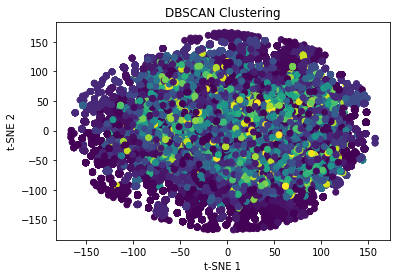

In [14]:
# Preprocessing and scaling the data (assuming df_kmeans is your DataFrame)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_numeric)

# Perform DBSCAN clustering based on the best hyperparameters
dbscan = DBSCAN(eps=0.9, min_samples=2)
dbscan_labels = dbscan.fit_predict(scaled_data)

# Reduce dimensionality to 2D using t-SNE
tsne = TSNE(n_components=2)
reduced_data = tsne.fit_transform(scaled_data)

# Visualize DBSCAN clusters
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=dbscan_labels, cmap='viridis')
plt.title("DBSCAN Clustering")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

In [15]:
# Visualize DBSCAN clusters using Plotly
fig = px.scatter(x=reduced_data[:, 0], y=reduced_data[:, 1], color=dbscan_labels,
                 labels={'x': 't-SNE 1', 'y': 't-SNE 2'},
                 color_continuous_scale='Viridis',
                 title="DBSCAN Clustering")
fig.show()

## hnswlib 

Run nearest neighbor within the cluster produced by DBSCAN.

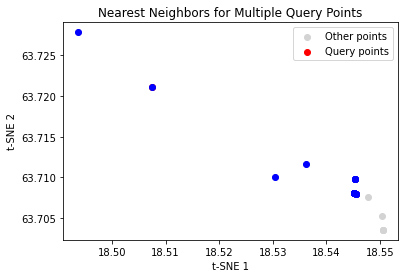

In [33]:
# Choose a cluster number
cluster_number = 1

# Get data points belonging to the chosen cluster
cluster_data = scaled_data[dbscan_labels == cluster_number]
cluster_data_reduced = reduced_data[dbscan_labels == cluster_number]

# Create an hnswlib index
dim = len(scaled_data[0])
index = hnswlib.Index(space='l2', dim=dim)

# Initialize the index
index.init_index(max_elements=len(cluster_data), ef_construction=100, M=16)

# Insert the data points into the index
for point in cluster_data:
    index.add_items(point)

# Set the search parameters
index.set_ef(50)

# Choose multiple query points within the cluster
query_points = cluster_data[:5]  # You can change this to any set of points in the cluster_data array
query_points_reduced = cluster_data_reduced[:5]

# Find nearest neighbors for the query points
n_neighbors = 5
labels_array, distances_array = index.knn_query(query_points, k=n_neighbors)

# Visualize nearest neighbors for multiple query points
plt.scatter(cluster_data_reduced[:, 0], cluster_data_reduced[:, 1], c='lightgray', label='Other points')
plt.scatter(query_points_reduced[:, 0], query_points_reduced[:, 1], c='red', label='Query points')

# Plot the nearest neighbors for each query point
for query_point_reduced, labels, distances in zip(query_points_reduced, labels_array, distances_array):
    nearest_neighbors_reduced = cluster_data_reduced[labels]
    plt.scatter(nearest_neighbors_reduced[:, 0], nearest_neighbors_reduced[:, 1], c='blue')

plt.title("Nearest Neighbors for Multiple Query Points")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.show()

In [36]:
#Run the same but by the query point
# Choose a cluster number
cluster_number = 1

# Get data points belonging to the chosen cluster
cluster_data = scaled_data[dbscan_labels == cluster_number]

# Create an hnswlib index
dim = len(scaled_data[0])
index = hnswlib.Index(space='l2', dim=dim)

# Initialize the index
index.init_index(max_elements=len(cluster_data), ef_construction=100, M=16)

# Insert the data points into the index
for point in cluster_data:
    index.add_items(point)

# Set the search parameters
index.set_ef(50)

# Find nearest neighbors for a query point within the cluster
query_point = cluster_data[0]  # You can change this to any point in the cluster_data array
n_neighbors = 10
labels, distances = index.knn_query(query_point, k=n_neighbors)

# Print nearest neighbors
print("Nearest neighbors within the cluster (index, distance):")
for i, (label, distance) in enumerate(zip(labels[0], distances[0])):
    print(f"{i + 1}. index: {label}, distance: {distance:.4f}")


Nearest neighbors within the cluster (index, distance):
1. index: 0, distance: 0.0000
2. index: 2, distance: 0.0000
3. index: 3, distance: 0.0000
4. index: 4, distance: 0.0000
5. index: 12, distance: 0.0000
6. index: 8, distance: 0.0275
7. index: 10, distance: 0.1098
8. index: 5, distance: 0.1098
9. index: 6, distance: 0.1098
10. index: 13, distance: 0.1098


Run nearest neighbor without predefined cluster (on the whole dataset).

Nearest neighbors for point at index 0 (index, distance):
1. index: 0, distance: 0.0000
2. index: 46602, distance: 0.0275
3. index: 61659, distance: 1.9579
4. index: 30189, distance: 2.0847
5. index: 31663, distance: 2.4758


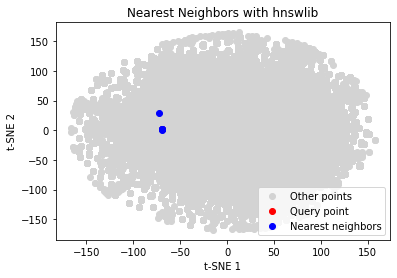

In [37]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_numeric)

# Reduce dimensionality to 2D using t-SNE
tsne = TSNE(n_components=2)
reduced_data = tsne.fit_transform(scaled_data)

Nearest neighbors for point at index 0 (index, distance):
1. index: 0, distance: 0.0000
2. index: 46602, distance: 0.0275
3. index: 61659, distance: 1.9579
4. index: 30189, distance: 2.0847
5. index: 31663, distance: 2.4758


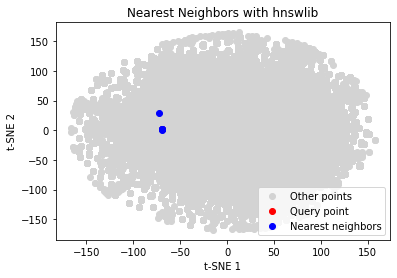

[    0 46602 61659 30189 31663]


In [42]:
# Create an hnswlib index
dim = len(scaled_data[0])
index = hnswlib.Index(space='l2', dim=dim)

# Initialize the index
index.init_index(max_elements=len(scaled_data), ef_construction=100, M=16)

# Insert the data points into the index
for point in scaled_data:
    index.add_items(point)

# Set the search parameters
index.set_ef(50)

# Choose a query point
query_point_index = 0
query_point = scaled_data[query_point_index]

# Find nearest neighbors for the query point
n_neighbors = 5
labels, distances = index.knn_query(query_point, k=n_neighbors)

# Print nearest neighbors
print(f"Nearest neighbors for point at index {query_point_index} (index, distance):")
for i, (label, distance) in enumerate(zip(labels[0], distances[0])):
    print(f"{i + 1}. index: {label}, distance: {distance:.4f}")
    

# Visualize nearest neighbors
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c='lightgray', label='Other points')
plt.scatter(reduced_data[query_point_index, 0], reduced_data[query_point_index, 1], c='red', label='Query point')
plt.scatter(reduced_data[labels[0], 0], reduced_data[labels[0], 1], c='blue', label='Nearest neighbors')

plt.title("Nearest Neighbors with hnswlib")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.show()

## Checking Performance

Calculate time and performance level. We do it by calculating the Recall (proportion of true nearest neighbors found in the search results). We obtain the ground truth by running an exhaustive search (using scikit-learn's NearestNeighbors with the brute algorithm).

In [41]:
from sklearn.neighbors import NearestNeighbors
import hnswlib
import time

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_numeric)

# Create an hnswlib index
dim = len(scaled_data[0])
index = hnswlib.Index(space='l2', dim=dim)

# Initialize the index
index.init_index(max_elements=len(scaled_data), ef_construction=100, M=16)

# Insert the data points into the index
for point in scaled_data:
    index.add_items(point)

# Set the search parameters
index.set_ef(50)

# Ground truth: Exhaustive search using scikit-learn's NearestNeighbors
nn = NearestNeighbors(n_neighbors=n_neighbors, algorithm='brute', metric='euclidean')
nn.fit(scaled_data)

# Choose a query point
query_point_index = 0
query_point = scaled_data[query_point_index]

# Time hnswlib search
start_time = time.time()
labels, distances = index.knn_query(query_point, k=n_neighbors)
hnswlib_time = time.time() - start_time

# Time exhaustive search
start_time = time.time()
true_distances, true_labels = nn.kneighbors(query_point.reshape(1, -1))
exhaustive_time = time.time() - start_time

# Calculate recall
recall = len(np.intersect1d(labels[0], true_labels[0])) / n_neighbors

print(f"Recall: {recall:.2f}")
print(f"hnswlib query time: {hnswlib_time:.6f} seconds")
print(f"Exhaustive query time: {exhaustive_time:.6f} seconds")

Recall: 1.00
hnswlib query time: 0.000108 seconds
Exhaustive query time: 0.004947 seconds
